# 1. Carga y procesamiento de imágenes

En este vamos a hacer un procesamiento con 2 imágenes, una del puzzle/rompecabezas (tamién lo llamamos Jigsaw a veces porque es el nombre en inglés de rompecabezas) por delante y otra por detrás. Este procesamiento lo hacemos para luego ponérselo de input al algoritmo que lo soluciona.

Autores:
- Jordi Hamberg Gallego
- Héctor Sancho Rodríguez

# Descripción e importación de imágenes


Antes de importar las imágenes, descargamos la librería tqdm, que sirve para ver una barra de progreso que dice más o menos cuánto nos queda para terminar los bucles, las iteraciones, etc.
También importamos varias librerias que sabemos que utilizaremos porque son esenciales.

In [1]:
!pip install tqdm
import cv2 as cv
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import sklearn

---


Las imágenes, tanto por delante como por detrás, son fotos tomadas por nosotros sobre un fondo blanco bien iluminado. Como era un puzzle muy grande de 240 piezas, hemos decidido solamente usar una pequeña zona 5x5 como demostración de concepto. Aún así, aunque nuestras piezas no tengan lados planos, es decir no tenemos bordes, nuestro algoritmo tiene en cuenta las piezas de borde y podrían solucionar un puzzle completo sin mayor dificultad.

Como las imágenes que tomamos estaban rotadas a derecha, le aplicamos la rotación para verlas bien. Las imágenes son de las 25 piezas puestas en 5x5.

(np.float64(-0.5), np.float64(3595.5), np.float64(2539.5), np.float64(-0.5))

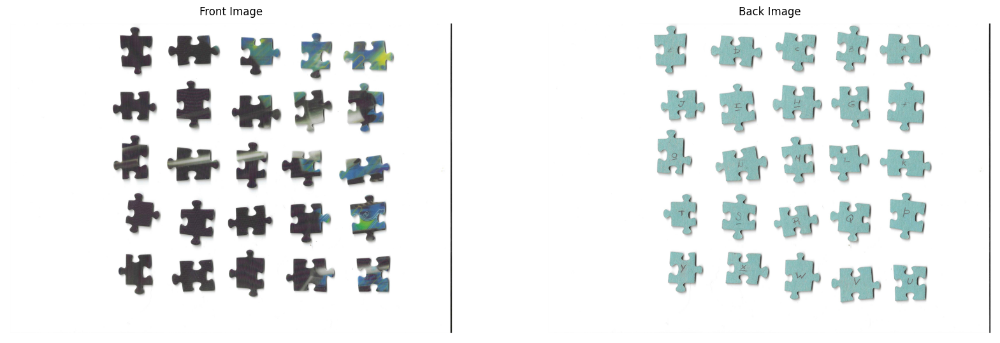

In [2]:
path = 'fotos/scan_25/'

front = cv.imread(path + 'front.jpg')
front = cv.rotate( front, cv.ROTATE_90_CLOCKWISE )
front = cv.copyMakeBorder(front, 30, 30, 30, 30, cv.BORDER_CONSTANT, value=[255, 255, 255])

back = cv.imread(path + 'back.jpg')
back = cv.rotate( back, cv.ROTATE_90_CLOCKWISE )
back = cv.copyMakeBorder(back, 30, 30, 30, 30, cv.BORDER_CONSTANT, value=[255, 255, 255])

front_gray = cv.cvtColor(front, cv.COLOR_BGR2GRAY)
back_gray = cv.cvtColor(back, cv.COLOR_BGR2GRAY)

fig, axes = plt.subplots(1, 2, figsize=(20, 10))
axes[0].imshow(cv.cvtColor(front, cv.COLOR_BGR2RGB))
axes[0].set_title('Front Image')
axes[0].axis('off')
axes[1].imshow(cv.cvtColor(back, cv.COLOR_BGR2RGB))
axes[1].set_title('Back Image')
axes[1].axis('off')

# Detección de las piezas

Como el fondo es blanco uniforme, podemos usar un threshold binario para detectar las pìezas del fondo, lo haremos con las piezas delanteras y traseras por separado.

(np.float64(-0.5), np.float64(3595.5), np.float64(2539.5), np.float64(-0.5))

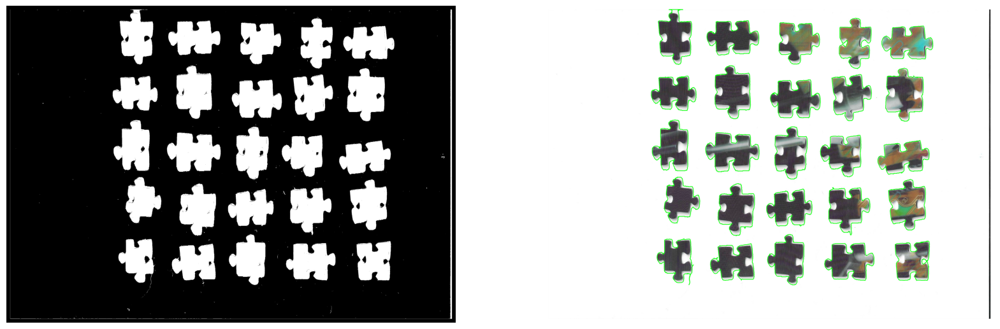

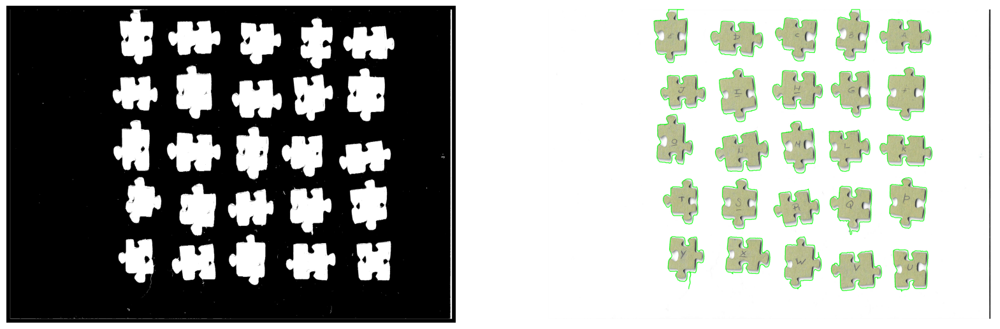

In [3]:
front_thresh = cv.threshold(front_gray, 250, 255, cv.THRESH_BINARY_INV)[1]
back_thresh = cv.threshold(back_gray, 250, 255, cv.THRESH_BINARY_INV)[1]


fig, ax = plt.subplots(1, 2, figsize=(20, 10))

plt.sca(ax[0])
plt.imshow(front_thresh, cmap='gray')
plt.axis('off')

front_contours , _ = cv.findContours(front_thresh, cv.RETR_EXTERNAL, cv.CHAIN_APPROX_SIMPLE)
front_contours = sorted(front_contours, key=cv.contourArea, reverse=True)[:25]
front_segmented = front.copy()
contornos_in_original = cv.drawContours(front_segmented, front_contours, -1, (0, 255, 0), 3)

plt.sca(ax[1])
plt.imshow(contornos_in_original)
plt.axis('off')

fig, ax = plt.subplots(1, 2, figsize=(20, 10))

plt.sca(ax[0])
plt.imshow(front_thresh, cmap='gray')
plt.axis('off')

back_contours , _ = cv.findContours(back_thresh, cv.RETR_EXTERNAL, cv.CHAIN_APPROX_SIMPLE)
back_contours = sorted(back_contours, key=cv.contourArea, reverse=True)[:25]
back_segmented = back.copy()
contornos_in_original = cv.drawContours(back_segmented, back_contours, -1, (0, 255, 0), 3)

plt.sca(ax[1])
plt.imshow(contornos_in_original)
plt.axis('off')

Este es un thresholding básico simplemente para sacar los contornos y luego sacar las ROIs de dónde está cada contorno, no es para sacar los contornos reales.

(np.float64(-0.5), np.float64(425.5), np.float64(326.5), np.float64(-0.5))

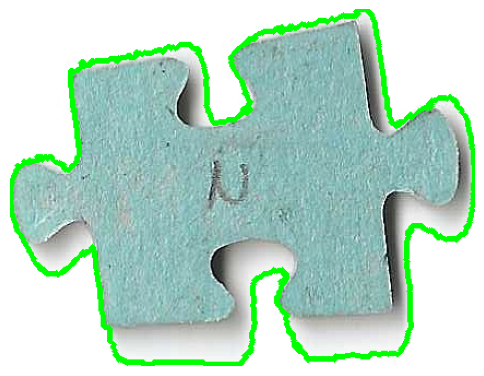

In [4]:
plt.figure(figsize=(6, 6))
x, y, w, h = cv.boundingRect(back_contours[0])
back_piece_copy = back[y:y+h, x:x+w].copy()
back_piece_copy_contour = back_thresh[y:y+h, x:x+w]
cv.drawContours(back_piece_copy, [back_contours[0] - [x, y]], -1, (0, 255, 0), 3)
plt.imshow(cv.cvtColor(back_piece_copy, cv.COLOR_BGR2RGB))
plt.axis('off')

Queremos guardar una asociación entre las piezas delanteras y traseras. Al principio, no podemos asociarlas ya que opencv encuentra los contornos de forma arbitraria y sin seguir ningún tipo de orden. Por eso, creamos una función `sort_contours` que ordena la lista de contornos según su posición espacial dentro de la foto asumiendo que están formando una cuadrícula en forma de rejilla 5x5. 

Lo primero que hacemos en la función es calcular el centroide de cada uno de los contornos con np.mean de las coordenadas de todos los puntos que forma cada contorno. Una vez tenemos los centroides los separamos en coordenadas x e y para hacerles un clustering mediante el algoritmo de KMeans de sklearn para tanto X como Y, asumiendo así que hay 5 filas, 5 columnas y que están más o menos alineadas. Así cada pieza queda etiquetada como fila_i, columna_j.

Por último, ordenamos de izquierda a derecha y luego de arriba hacia abajo. Para cada posición nos dice cuál es el contorno que está en esa fila y columna y ya tenemos la lista ordenada.


In [5]:
def sort_contours(contours, imagen, ax = None):

    if ax != None:
        plt.sca(ax)
        plt.grid("off")

    ordered_contours = []


    centroids = np.array([np.mean(c.reshape(-1, 2), axis=0) for c in contours])
    x_centroids = centroids[:, 0]
    y_centroids = centroids[:, 1]

    # Hacemos un clustering para agrupar las coordenadas en 5 grupos
    x_prediction = sklearn.cluster.KMeans(n_clusters=5, random_state=0).fit(x_centroids.reshape(-1, 1))
    y_prediction = sklearn.cluster.KMeans(n_clusters=5, random_state=0).fit(y_centroids.reshape(-1, 1))

    # ploteamos la regilla generada para comprobar que es correcta
    plt.imshow(imagen)
    

    for i in range(5):
        plt.axvline(x=np.mean(x_centroids[x_prediction.labels_ == i]), color='black', linestyle='--')
        plt.axhline(y=np.mean(y_centroids[y_prediction.labels_ == i]), color='black', linestyle='--')

    plt.scatter(x_centroids, y_centroids, c=y_prediction.labels_ * 5, cmap='tab20')

    plt.title('Clustering de centroides')
    plt.xlabel('Coordenada X')
    plt.ylabel('Coordenada Y')
    plt.grid()

    cluster_centers_x = sorted(list(enumerate(x_prediction.cluster_centers_.flatten())), key=lambda x: x[1])
    cluster_centers_y = sorted(list(enumerate(y_prediction.cluster_centers_.flatten())), key=lambda x: x[1])

    for i, y_center in cluster_centers_y:
        for j, x_center in cluster_centers_x:
            index = np.where((y_prediction.labels_ == i) & (x_prediction.labels_ == j))[0][0]
            centroid = centroids[index]
            ordered_contours.append(contours[index])
            plt.text(centroid[0], centroid[1], f'{len(ordered_contours)}', color='red', fontsize=12)
    
    return ordered_contours

Comprobamos que funciona bien con los plots:

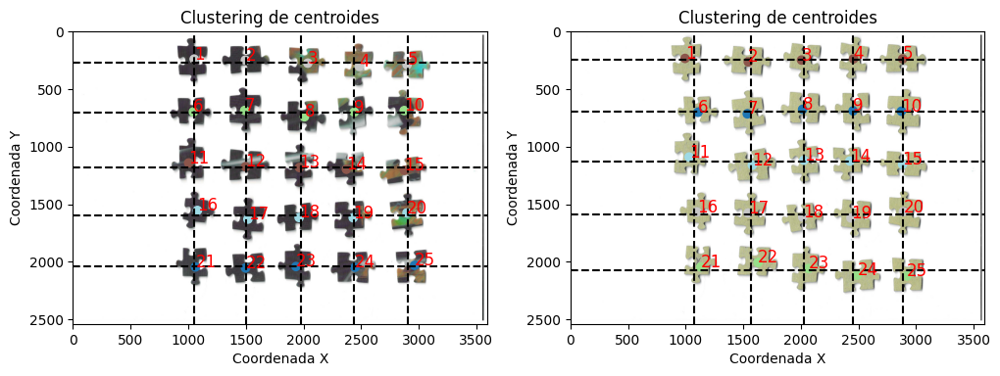

In [6]:
fig, axes = plt.subplots(1, 2, figsize=(12, 6))
axes = axes.flatten()

front_contours = sort_contours(front_contours, front, ax=axes[0])
back_contours = sort_contours(back_contours, back, ax=axes[1])

Vemos que ahora tras ordenar los contornos nos crea una asociación correcta entre las piezas delanteras y las traseras.

A continuación vamos a generar los ROIS de cada uno de los contornos, es decir, de cada una de las piezas. Simplemente lo hacemos recortando mirando el máximo y mínimo de cada coordenada y añadiéndole un padding para que no se recorte la figura.

In [7]:
front_rois = []

for contorno in front_contours:

    center = np.mean(contorno, axis=0).astype(int)
    max_x = np.max(contorno[:, 0, 0])
    min_x = np.min(contorno[:, 0, 0])
    max_y = np.max(contorno[:, 0, 1])
    min_y = np.min(contorno[:, 0, 1])

    pad = 20

    roi_front = front[min_y - pad:max_y + pad, min_x - pad:max_x + pad]
    front_rois.append(roi_front)

back_rois = []

for contorno in back_contours:

    center = np.mean(contorno, axis=0).astype(int)
    max_x = np.max(contorno[:, 0, 0])
    min_x = np.min(contorno[:, 0, 0])
    max_y = np.max(contorno[:, 0, 1])
    min_y = np.min(contorno[:, 0, 1])

    pad = 20

    roi_back = back[min_y - pad:max_y + pad, min_x - pad:max_x + pad]
    back_rois.append(roi_back)

Ahora comprobamos que los ROIS se hayan hecho correctamente, lo ploteamos con gridspec de matplotlib que nos permite ver muchos plots juntos en el mismo canvasd.

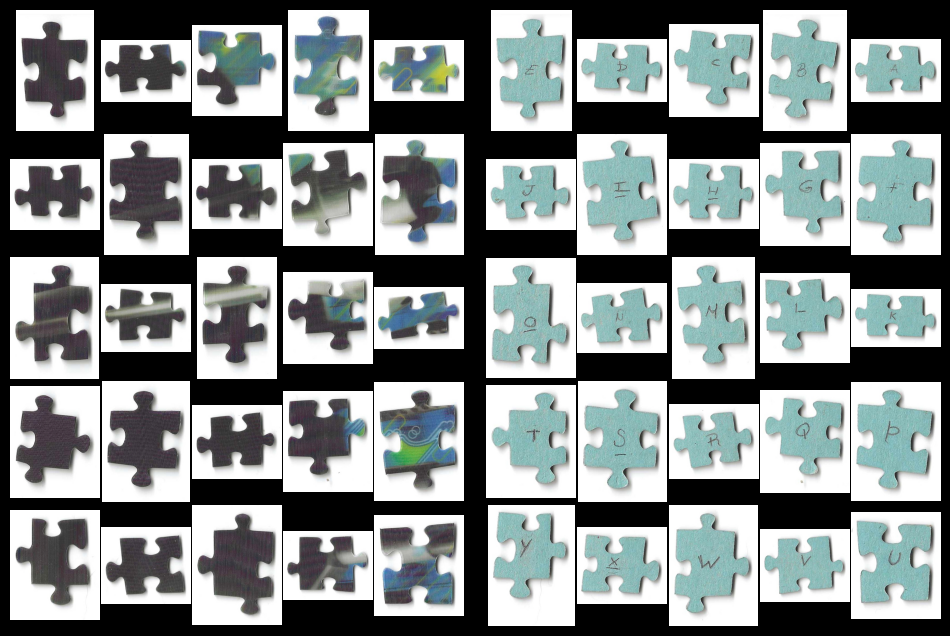

In [8]:
import matplotlib.gridspec as gridspec


fig = plt.figure(figsize=(12, 8), facecolor='black')

outer_gs = gridspec.GridSpec(1, 2, wspace=0.05)

left_gs = gridspec.GridSpecFromSubplotSpec(
    5, 5, subplot_spec=outer_gs[0], wspace=0.02, hspace=0.02
)

for i in range(25):
    ax = fig.add_subplot(left_gs[i])
    ax.imshow(cv.cvtColor(front_rois[i], cv.COLOR_BGR2RGB))
    ax.axis('off')


right_gs = gridspec.GridSpecFromSubplotSpec(
    5, 5, subplot_spec=outer_gs[1], wspace=0.02, hspace=0.02
)

for i in range(25):
    ax = fig.add_subplot(right_gs[i])
    ax.imshow(cv.cvtColor(back_rois[i], cv.COLOR_BGR2RGB))
    ax.axis('off')

plt.show()

Una vez comprobado que los rois son correctos vamos a guardarlos enumerados en una carpeta.

In [9]:
for i, roi in enumerate(front_rois):
    cv.imwrite(f'fotos/segmented_scan_25/front/{i:02d}.png', roi)

for i, roi in enumerate(back_rois):
    cv.imwrite(f'fotos/segmented_scan_25/back/{i:02d}.png', roi)

# Segmentación de las piezas
Un paso clave que definirá si el proyecto es o no viable es la segmentación de las piezas. Generar un contorno lo más preciso posible de las piezas es fundamental y condicionará la detección de esquinas, y ambas cosas son necesarias para medir la disimilaidad entre aristas y comprobar si encajan o no, cosa que si no hacemos bien puede hacer que el proyecto no sea viable.

Vamos a tomar una sola pieza (vista desde atrás) para hacer las pruebas.

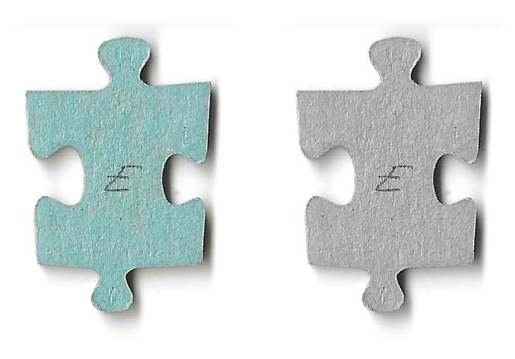

In [10]:
sample_back = cv.imread('fotos/segmented_scan_25/back/00.png')
sample_back_gray = cv.cvtColor(sample_back, cv.COLOR_BGR2GRAY)

fig, axs = plt.subplots(1, 2)
axs[0].imshow(cv.cvtColor(sample_back, cv.COLOR_BGR2RGB))
axs[0].axis('off')

axs[1].imshow(sample_back_gray, cmap='gray')
axs[1].axis('off')
plt.show()

## Pruebas thresholding

### Thressholding simple

Probaremos distintas técnicas de thresholding vistas en clase para hacer un recorte lo más preciso de la pieza, lo cual es clave para poder hacer detección de esquinas y calcular dissimilarity entre piezas.

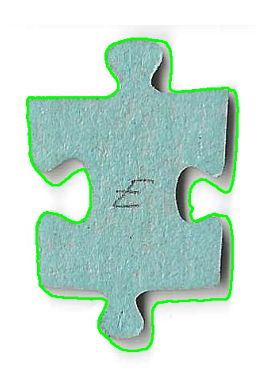

In [11]:
# 1. Aplicamos blurr para reducir ruido
blurred = cv.GaussianBlur(sample_back_gray, (5, 5), 0)

# 2. Thressholding simple
_, thress_simple = cv.threshold(blurred, 220, 255, cv.THRESH_BINARY_INV)

# 4. Detección de contornos
contours_simple, _ = cv.findContours(thress_simple, cv.RETR_EXTERNAL, cv.CHAIN_APPROX_SIMPLE)
best_contour_simple = max(contours_simple, key=cv.contourArea)

# Dibujar contorno sobre la imagen original
img_contour_simple = sample_back.copy()
cv.drawContours(img_contour_simple, [best_contour_simple], 0, (0, 255, 0), 2)
plt.imshow(cv.cvtColor(img_contour_simple, cv.COLOR_BGR2RGB))
plt.axis('off')
plt.show()

Comprobamos que tenemos muchos problemas con las sombras y ajustar el threshold no ayuda mucho. Probamos thresholding Otsu.

### Thressholding Otsu

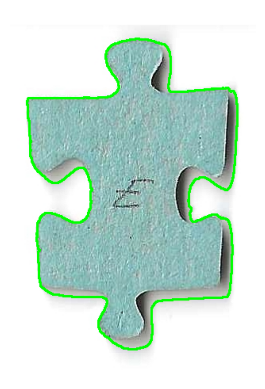

In [12]:
# 1_Aplicamos blurr para reducir ruido
blurred = cv.GaussianBlur(sample_back_gray, (5, 5), 0)

# 3_Thressholding Otsu
_, thress_otsu = cv.threshold(blurred, 0, 255, cv.THRESH_BINARY_INV + cv.THRESH_OTSU)

# 4_Deteccion de contornos
contours_otsu, _ = cv.findContours(thress_otsu, cv.RETR_EXTERNAL, cv.CHAIN_APPROX_SIMPLE)
best_contour_otsu = max(contours_otsu, key=cv.contourArea)

# Dibujar contorno sobre la imagen original
img_contour_otsu = sample_back.copy()
cv.drawContours(img_contour_otsu, [best_contour_otsu], 0, (0, 255, 0), 2)
plt.imshow(cv.cvtColor(img_contour_otsu, cv.COLOR_BGR2RGB))
plt.axis('off')
plt.show()

Vemos que tampoco nos ha sido muy poco útil, casi idéntico al thresholding normal, al final lo único que hace es encontrar un threshold óptimo para la mejor segmentación posible.

### Thresholding Adaptativo

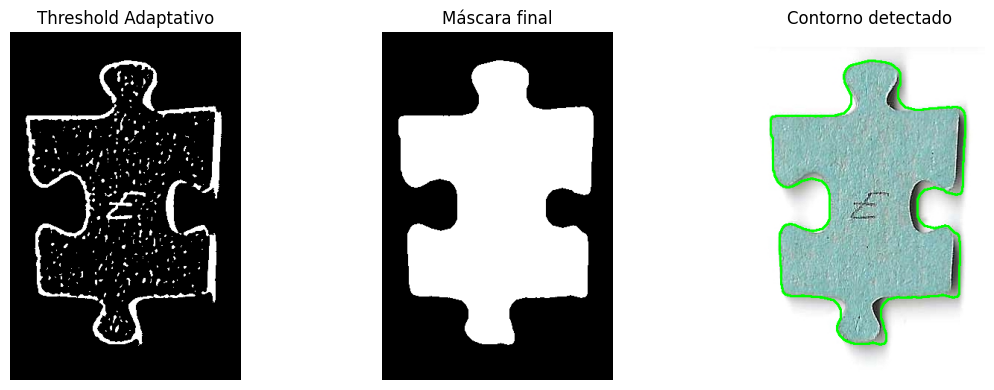

In [13]:
# 1_Aplicamos blurr para reducir ruido
blurred = cv.GaussianBlur(sample_back_gray, (9, 9), 0)

# 2_Thresholding Adaptativo (Gaussian)
thress_adaptive = cv.adaptiveThreshold(
    blurred, 
    255, 
    cv.ADAPTIVE_THRESH_GAUSSIAN_C, 
    cv.THRESH_BINARY_INV, 
    blockSize=21, 
    C=5           
)

# 3_Operaciones morfológicas para cerrar huecos
kernel = cv.getStructuringElement(cv.MORPH_ELLIPSE, (15, 15))
# Closing: dilata y luego erosiona (cierra huecos pequeños)
closed = cv.morphologyEx(thress_adaptive, cv.MORPH_CLOSE, kernel, iterations=3)
# Opening: erosiona y luego dilata (elimina ruido pequeño)
opened = cv.morphologyEx(closed, cv.MORPH_OPEN, kernel, iterations=1)

# Combinar con la máscara original
mask_final = cv.bitwise_or(opened, opened)

# 5_Deteccion de contornos
contours_adaptive, _ = cv.findContours(mask_final, cv.RETR_EXTERNAL, cv.CHAIN_APPROX_SIMPLE)
best_contour_adaptive = max(contours_adaptive, key=cv.contourArea)

# Visualización
fig, axs = plt.subplots(1, 3, figsize=(12, 4))
axs[0].imshow(thress_adaptive, cmap='gray')
axs[0].set_title('Threshold Adaptativo')
axs[0].axis('off')

axs[1].imshow(mask_final, cmap='gray')
axs[1].set_title('Máscara final')
axs[1].axis('off')

# Dibujar contorno sobre la imagen original
img_contour_adaptive = sample_back.copy()
cv.drawContours(img_contour_adaptive, [best_contour_adaptive], 0, (0, 255, 0), 2)
axs[2].imshow(cv.cvtColor(img_contour_adaptive, cv.COLOR_BGR2RGB))
axs[2].set_title('Contorno detectado')
axs[2].axis('off')

plt.tight_layout()
plt.show()

Observamos que aún intentando ajustar mucho los parámetros y aplicando operaciones morfológicas no conseguimos un recorte preciso de la pieza, lo cual es clave para continuar por lo que vamos a probar nuevas opciones.

### KNN Segmentation

Basándonos en que en esencia tenemos 3 colores (pieza, fondo, sombra) vamos a probar a usar la técnica de aprendizaje no supervisado KNN para segmentar en 3 colores la pieza del fondo, que esperamos que sean los 3 colores dominantes.

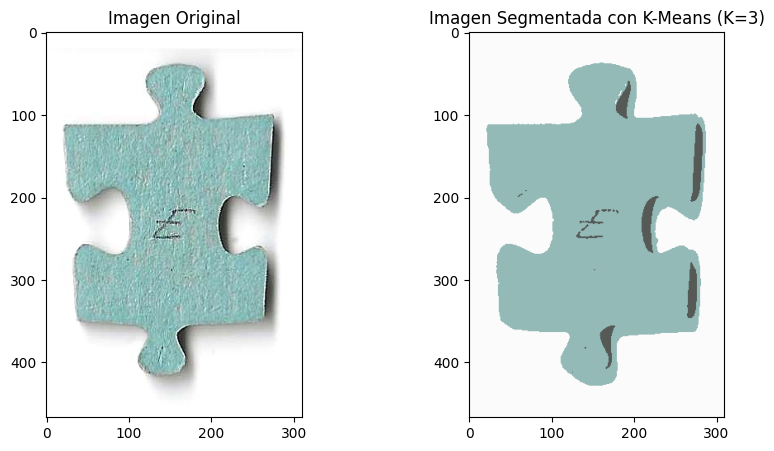

In [14]:
# 1_Aplicamos blur para reducir ruido
blurred = cv.GaussianBlur(sample_back, (5, 5), 0)

# Reshape para K-Means: cada pixel es un punto en espacio RGB
pixels = blurred.reshape((-1, 3)).astype(np.float32)

# Criterios de parada
criteria = (cv.TERM_CRITERIA_EPS + cv.TERM_CRITERIA_MAX_ITER, 100, 0.2)

# Aplicar K-Means con K=3
K = 3
_, labels, centers = cv.kmeans(pixels, K, None, criteria, 10, cv.KMEANS_RANDOM_CENTERS)

# Reconstruir la imagen segmentada
segmented_image = centers[labels.flatten()].reshape(sample_back.shape).astype(np.uint8)

#plotear resultados
plt.figure(figsize=(10, 5))
plt.subplot(1, 2, 1)
plt.imshow(cv.cvtColor(sample_back, cv.COLOR_BGR2RGB))
plt.title('Imagen Original')

plt.subplot(1, 2, 2)
plt.imshow(cv.cvtColor(segmented_image, cv.COLOR_BGR2RGB))
plt.title('Imagen Segmentada con K-Means (K=3)')
plt.show()

Vemos que mejora en la detección de sombras como esperábamos, pero la forma de la figura en sí no está bien definida, ya que además no se clasifica correctamente la letra dibujada a lápiz.

### Segmentación por espacio de color HSV

Usando el espacio HSV podemos separar la pieza (color turquesa) del fondo, aprovechándonos que el único elemento con color (Saturación) es la pieza, y el resto de la imagen (fondo y sombras) tienen baja saturación. Con esto y operaciones morfologicas creemos que conseguimos un recorte bastante bueno.

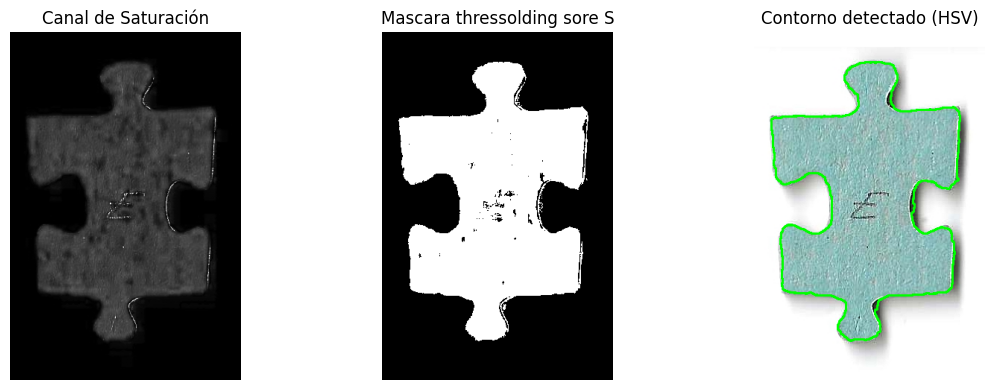

In [15]:
# 1_Convertir a espacio de color HSV
hsv = cv.cvtColor(sample_back, cv.COLOR_BGR2HSV)

# Separar los canales H, S, V
h_channel, s_channel, v_channel = cv.split(hsv)


# 2_Thressholding en el canal de saturación 
_, mask_hsv = cv.threshold(s_channel, 30, 255, cv.THRESH_BINARY)

fig, axs = plt.subplots(1, 3, figsize=(12, 4))
axs[0].imshow(s_channel, cmap='gray')
axs[0].set_title('Canal de Saturación')
axs[0].axis('off')

# ploteamos la mascara
axs[1].imshow(mask_hsv, cmap='gray')
axs[1].set_title('Mascara thressolding sore S')
axs[1].axis('off')

# 3_Operaciones morfológicas para limpiar la máscara
kernel = cv.getStructuringElement(cv.MORPH_ELLIPSE, (5, 5))
mask_hsv = cv.morphologyEx(mask_hsv, cv.MORPH_CLOSE, kernel, iterations=2)
mask_hsv = cv.morphologyEx(mask_hsv, cv.MORPH_OPEN, kernel, iterations=1)

# 4_Detección de contornos
contours_hsv, _ = cv.findContours(mask_hsv, cv.RETR_EXTERNAL, cv.CHAIN_APPROX_SIMPLE)
best_contour_hsv = max(contours_hsv, key=cv.contourArea)


# Dibujar contorno sobre la imagen original
img_contour_hsv = sample_back.copy()
cv.drawContours(img_contour_hsv, [best_contour_hsv], 0, (0, 255, 0), 2)
axs[2].imshow(cv.cvtColor(img_contour_hsv, cv.COLOR_BGR2RGB))
axs[2].set_title('Contorno detectado (HSV)')
axs[2].axis('off')

plt.tight_layout()
plt.show()

In [17]:
print("Numero de nodos: ", len(best_contour_hsv))

Numero de nodos:  600


Con el número de notos que hemos detectado sí que podemos estar satisfechos, más teniendo en cuenta que mediante interpolación podemos aumentar el número de nodos si es necesario, o reducirlo y reducir ruido.

En este caso sí que conseguimos unos resultados bastante buenos, veamos cómo lo hace para todo el conjunto de piezas.

Definimos este thresholding como función para usarlo después.

In [18]:
def segment_piece(image: np.ndarray):

    hsv = cv.cvtColor(image, cv.COLOR_BGR2HSV)
    h_channel, s_channel, v_channel = cv.split(hsv)
    _, mask_hsv = cv.threshold(s_channel, 30, 255, cv.THRESH_BINARY)

    kernel = cv.getStructuringElement(cv.MORPH_ELLIPSE, (5, 5))
    mask_hsv = cv.morphologyEx(mask_hsv, cv.MORPH_CLOSE, kernel, iterations=2)
    mask_hsv = cv.morphologyEx(mask_hsv, cv.MORPH_OPEN, kernel, iterations=1)

    contours_hsv, _ = cv.findContours(mask_hsv, cv.RETR_EXTERNAL, cv.CHAIN_APPROX_SIMPLE)
    best_contour_hsv = max(contours_hsv, key=cv.contourArea)

    return best_contour_hsv


Ploteamos la segmentación en todas las piezas.

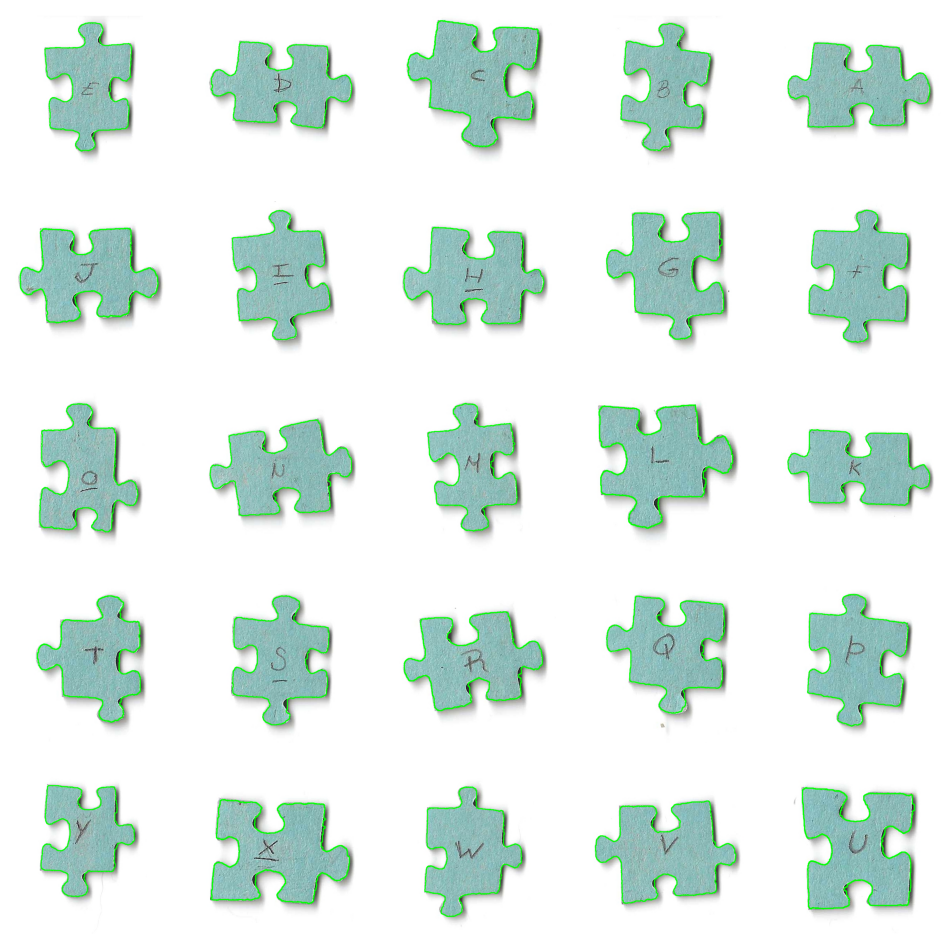

In [19]:
fig, axs = plt.subplots(5, 5, figsize=(12, 12))
axs = axs.flatten()

for i in range(25):
    sample_back = back_rois[i]
    contour = segment_piece(sample_back)

    img_contour = sample_back.copy()
    cv.drawContours(img_contour, [contour], 0, (0, 255, 0), 2)
    axs[i].imshow(cv.cvtColor(img_contour, cv.COLOR_BGR2RGB))
    axs[i].axis('off')
    
plt.show()

Comprobamos que los resultados son buenos pero aún así vamos a usar métodos más avanzados de segmentación a continuación, ya que consideramos que para que el proyecto sea viable es necesario tener una segmentación lo más precisa posible.

## Grab Cut para segmentación precisa

### Ajuste del margen.

Haremos el rectángulo inicial con un thresholding muy básico ajustado pero asegurándonos de no cortar la pieza.

In [20]:
sample_piece = back_rois[0]
sample_piece_gray = cv.cvtColor(sample_piece, cv.COLOR_BGR2GRAY)

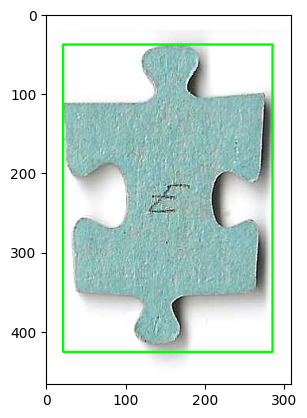

In [21]:
mask = cv.threshold(sample_piece_gray, 200, 255, cv.THRESH_BINARY_INV)[1]

minx = np.min(np.where(mask == 255)[1])
maxx = np.max(np.where(mask == 255)[1])
miny = np.min(np.where(mask == 255)[0])
maxy = np.max(np.where(mask == 255)[0])

rect = (minx, miny, maxx - minx, maxy - miny)

img = sample_piece.copy()
cv.rectangle(img, (minx, miny), (maxx, maxy), (0, 255, 0), 2)
plt.imshow(cv.cvtColor(img, cv.COLOR_BGR2RGB))

Esto nos va a servir para hacer el thresholding más avanzado con GrabCut.

Como hemos visto en la documentación, para poder aplicar GrabCut necesitamos pasarle tres variables/parámetros, mask_gc, bgd_model y fgd_model. Estos dos últimos son como modelos temporales para GrabCut.

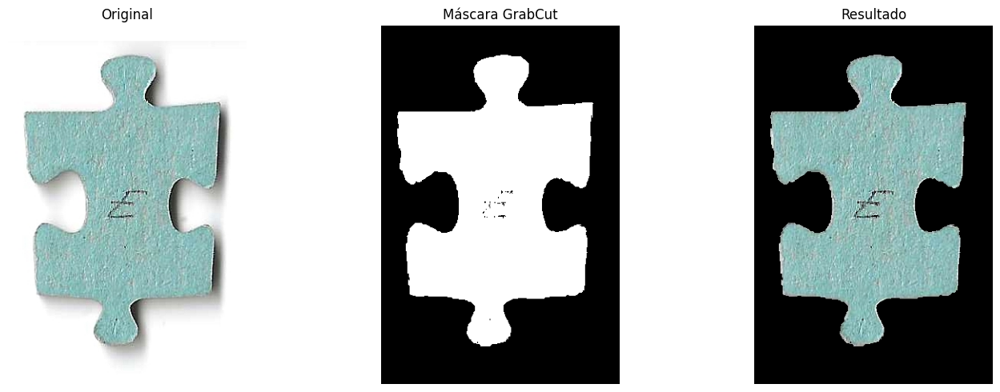

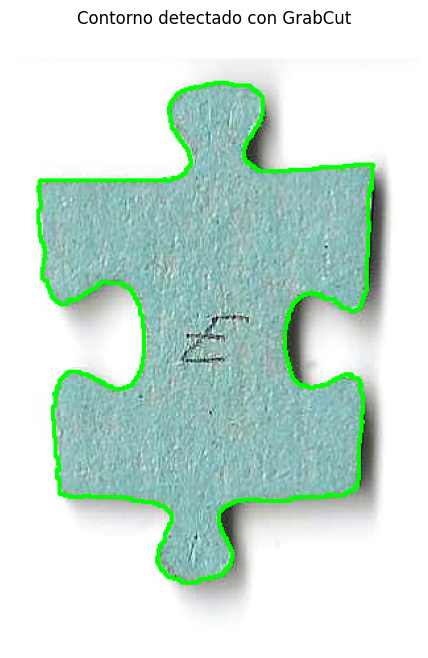

In [22]:
mask_gc = np.zeros(sample_piece.shape[:2], np.uint8)

# Modelos temporales para GrabCut
bgd_model = np.zeros((1, 65), np.float64)
fgd_model = np.zeros((1, 65), np.float64)

# Ejecutar GrabCut con rectángulo inicial
cv.grabCut(sample_piece,
           mask_gc,
           rect,
           bgd_model,
           fgd_model,
           50,
           cv.GC_INIT_WITH_RECT)

# Crear máscara binaria (0,2 = fondo, 1,3 = primer plano)
mask_result = np.where((mask_gc == 2) | (mask_gc == 0), 0, 1).astype('uint8')

# Aplicar máscara a la imagen
result = sample_piece * mask_result[:, :, np.newaxis]

# Visualizar resultados
fig, axes = plt.subplots(1, 3, figsize=(15, 5))

axes[0].imshow(cv.cvtColor(sample_piece, cv.COLOR_BGR2RGB))
axes[0].set_title('Original')
axes[0].axis('off')

axes[1].imshow(mask_result, cmap='gray')
axes[1].set_title('Máscara GrabCut')
axes[1].axis('off')

axes[2].imshow(cv.cvtColor(result, cv.COLOR_BGR2RGB))
axes[2].set_title('Resultado')
axes[2].axis('off')

plt.tight_layout()
plt.show()

# Obtener contorno de la máscara
contours_gc, _ = cv.findContours(mask_result, cv.RETR_EXTERNAL, cv.CHAIN_APPROX_SIMPLE)
best_contour_gc = max(contours_gc, key=cv.contourArea)

# Dibujar contorno
img_contour = sample_piece.copy()
cv.drawContours(img_contour, [best_contour_gc], 0, (0, 255, 0), 2)

plt.figure(figsize=(8, 8))
plt.imshow(cv.cvtColor(img_contour, cv.COLOR_BGR2RGB))
plt.title('Contorno detectado con GrabCut')
plt.axis('off')
plt.show()

In [23]:
print("Numero de nodos: ", len(img_contour))

Numero de nodos:  467


Vemos que este es el mejor contorno encontrado hasta el momento. Parece un modelo muy prometedor. Vamos a meterlo todo en una función y pasar como parámetro el número de iteraciones.

In [24]:
def apply_grabcut(image, iterations=50):
    def get_rect():
        mask = cv.threshold(cv.cvtColor(image, cv.COLOR_BGR2GRAY), 200, 255, cv.THRESH_BINARY_INV)[1]
        minx = np.min(np.where(mask == 255)[1])
        maxx = np.max(np.where(mask == 255)[1])
        miny = np.min(np.where(mask == 255)[0])
        maxy = np.max(np.where(mask == 255)[0])
        margin = 5
        return (minx - margin, miny - margin, maxx - minx + 2 * margin, maxy - miny + 2 * margin)

    rect = get_rect()

    mask_gc = np.zeros(image.shape[:2], np.uint8)

    bgd_model = np.zeros((1, 65), np.float64)
    fgd_model = np.zeros((1, 65), np.float64)



    cv.grabCut(image,
               mask_gc,
               rect,
               bgd_model,
               fgd_model,
               iterations,
                cv.GC_INIT_WITH_RECT)

    mask_result = np.where((mask_gc == 2) | (mask_gc == 0), 0, 1).astype('uint8')
    contours = cv.findContours(mask_result, cv.RETR_EXTERNAL, cv.CHAIN_APPROX_SIMPLE)[0]
    best_contour = max(contours, key=cv.contourArea)

    return best_contour

Comprobamos para todas las piezas:

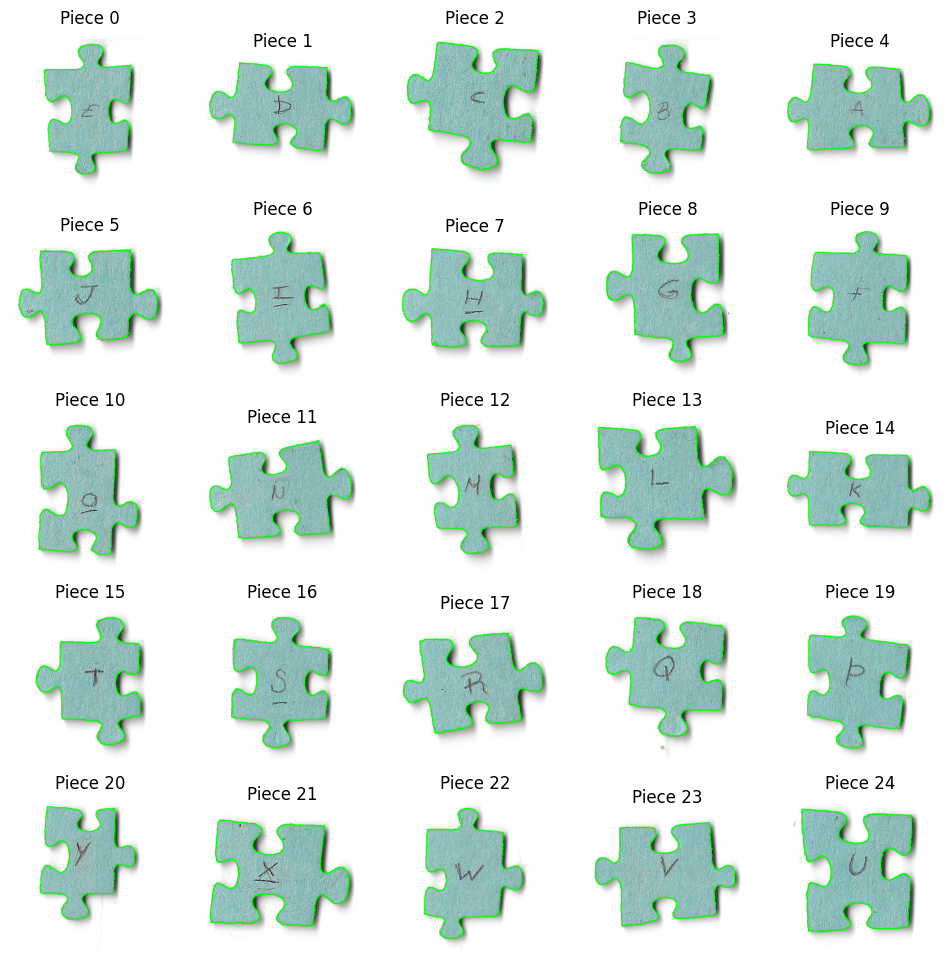

In [25]:
fig, axs = plt.subplots(5, 5, figsize=(12, 12))
axs = axs.flatten()

back_masks = []
back_contours = []

for i in range(25):
    contour = apply_grabcut(back_rois[i], iterations=30)
    img_contour = back_rois[i].copy()
    cv.drawContours(img_contour, [contour], 0, (0, 255, 0), 2)
    axs[i].imshow(cv.cvtColor(img_contour, cv.COLOR_BGR2RGB))
    axs[i].set_title(f'Piece {i}')
    axs[i].axis('off')

    mask = cv.drawContours(np.zeros(back_rois[i].shape[:2], dtype=np.uint8), [contour], -1, 255, thickness=-1)

    back_masks.append(mask)
    back_contours.append(contour)

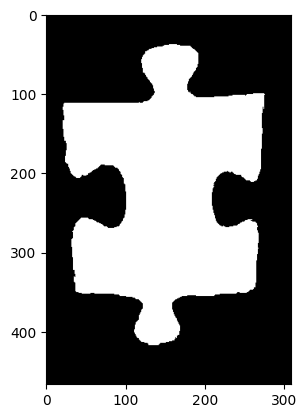

In [30]:
plt.imshow(back_masks[0], cmap='gray')

Ahora lo hacemos con las imágenes front. Lo hacemos con thresholding porque auque es menos preciso y toma alguna sombra, como no lo vamos a usar en dissimilarity es más rápido y más robusto que grabcut para estas imágenes que tienen más texturas y colores.

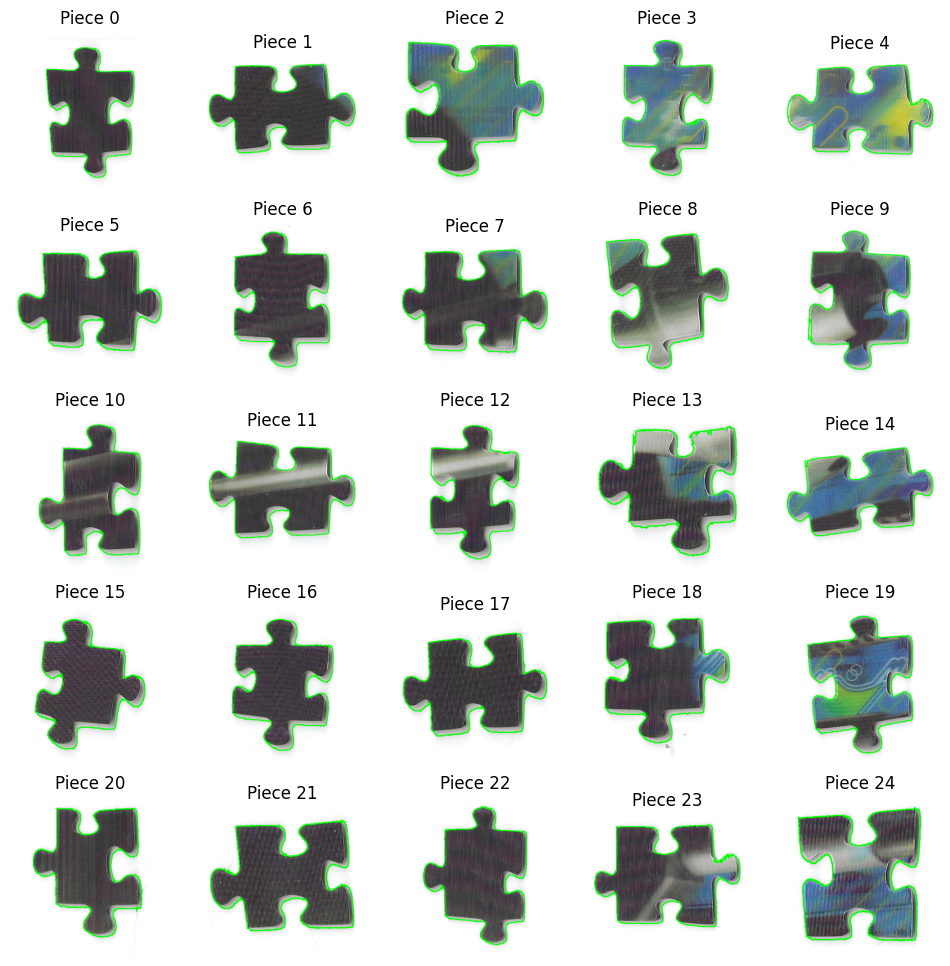

In [31]:
fig, axs = plt.subplots(5, 5, figsize=(12, 12))
axs = axs.flatten()

front_masks = []
front_contours = []

for i in range(25):
    # Sacaremos los contornos con thressholding
    thress = cv.threshold(cv.cvtColor(front_rois[i], cv.COLOR_BGR2GRAY), 215, 255, cv.THRESH_BINARY_INV)[1]
    contours_thress, _ = cv.findContours(thress, cv.RETR_EXTERNAL, cv.CHAIN_APPROX_SIMPLE)
    best_contour_thress = max(contours_thress, key=cv.contourArea)
    img_contour = front_rois[i].copy()
    cv.drawContours(img_contour, [best_contour_thress], 0, (0, 255, 0), 2)
    axs[i].imshow(cv.cvtColor(img_contour, cv.COLOR_BGR2RGB))
    axs[i].set_title(f'Piece {i}')
    axs[i].axis('off')
    
    mask = cv.drawContours(np.zeros(front_rois[i].shape[:2], dtype=np.uint8), [best_contour_thress], -1, 255, thickness=-1)

    front_masks.append(mask)
    front_contours.append(best_contour_thress)

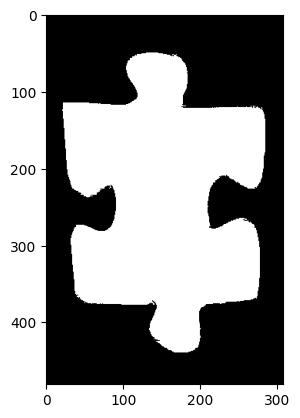

In [32]:
plt.imshow(front_masks[0], cmap='gray')

# Detección de esquinas de las máscaras.



## Método HoughLines

Para la detección de esquinas, probamos a hacerlo mediante HoughLines primero. Lo primero que hacemos es detectar los bordes con el algoritmo de Canny. Luego con los parámetros metidos detectamos las lineas con HoughLines. Luego extendemos las líneas detectadas para que podamos calcular las intersecciones de estas y así calcular puntos de corte entre líneas que forman las aristas. Finalmente, buscamos el punto más cercano de cada punto de corte en el contorno de la pieza. 

Para calcular las intersecciones primero vamos a separar las líneas en horizontales y verticales y solo vamos a calcular las intersecciones entre líneas de tipos contrarios, para que no hayan errores y encuentre puntos de corte entre dos líneas que forman parte de la misma arista. Para que no encuentre dos puntos de corte en la misma esquina, hacemos que solo pueda haber uno en cada cuadrante, además miramos los puntos de corte que estén más alejados del centroide del contorno en cada cuadrante para que no haya puntos de corte dentro de la figura. Finalmente ya tenemos los puntos de corte y podemos encontrar ya el punto más cercano del contorno.

Finalmente hacemos un parámetro verbose dentro de la función para plotear diferentes representaciones. El primer plot será para las líneas detectadas. El segundo plot enseña las intersecciones, mostrando también las líneas horizontales y verticales completamente extendidas y los puntos de corte. Y el último plot enseña las esquinas seleccionadas para las esquinas.

In [33]:
def detect_corners_hough(mask, contour, min_line_length=50, max_line_gap=10, threshold=50, verbose=True):
    
    
    edges = cv.Canny(mask, 50, 150)
    lines = cv.HoughLinesP(edges, 
                           rho=1, 
                           theta=np.pi/180, 
                           threshold=threshold,
                           minLineLength=min_line_length, 
                           maxLineGap=max_line_gap)
    
    
    def extend_line(x1, y1, x2, y2, length=1000):
        dx = x2 - x1
        dy = y2 - y1
        norm = np.sqrt(dx**2 + dy**2)
        if norm == 0:
            return (x1, y1, x2, y2)
        dx, dy = dx/norm, dy/norm
        x1_ext = int(x1 - dx * length)
        y1_ext = int(y1 - dy * length)
        x2_ext = int(x2 + dx * length)
        y2_ext = int(y2 + dy * length)
        return (x1_ext, y1_ext, x2_ext, y2_ext)
    
    
    def line_intersection(line1, line2):
        x1, y1, x2, y2 = line1
        x3, y3, x4, y4 = line2
        
        denom = (x1-x2)*(y3-y4) - (y1-y2)*(x3-x4)
        if abs(denom) < 1e-10:
            return None
        
        t = ((x1-x3)*(y3-y4) - (y1-y3)*(x3-x4)) / denom
        
        px = x1 + t*(x2-x1)
        py = y1 + t*(y2-y1)
        
        return (px, py)
    
    
    def closest_point_on_contour(point, contour):
        contour_points = contour.reshape(-1, 2)
        distances = np.linalg.norm(contour_points - point, axis=1)
        idx = np.argmin(distances)
        return contour_points[idx], distances[idx]
    
    
    def get_line_angle(line):
        x1, y1, x2, y2 = line
        return np.arctan2(y2-y1, x2-x1) * 180 / np.pi
    
    
    horizontal_lines = []
    vertical_lines = []
    for line in lines:
        x1, y1, x2, y2 = line[0]
        angle = abs(get_line_angle(line[0]))  
        if angle < 45 or angle > 135:
            horizontal_lines.append(extend_line(x1, y1, x2, y2))
        else:
            vertical_lines.append(extend_line(x1, y1, x2, y2))
    
    
    intersections = []
    for h_line in horizontal_lines:
        for v_line in vertical_lines:
            intersection = line_intersection(h_line, v_line)
            if intersection:
                px, py = intersection
                if 0 <= px < mask.shape[1] and 0 <= py < mask.shape[0]:
                    intersections.append(intersection)
    intersections = np.array(intersections)
    
    
    centroid = np.mean(contour.reshape(-1, 2), axis=0)
    quadrants = {0: [], 1: [], 2: [], 3: []}
    for point in intersections:
        dx = point[0] - centroid[0]
        dy = point[1] - centroid[1]
        if dx >= 0 and dy < 0:
            quadrants[0].append(point)
        elif dx < 0 and dy < 0:
            quadrants[1].append(point)
        elif dx < 0 and dy >= 0:
            quadrants[2].append(point)
        else:
            quadrants[3].append(point)
    selected_intersections = []
    for q in range(4):
        if quadrants[q]:
            points = np.array(quadrants[q])
            distances = np.linalg.norm(points - centroid, axis=1)
            best_idx = np.argmax(distances)
            selected_intersections.append(points[best_idx])
    selected_intersections = np.array(selected_intersections)
    
   
    corners = []
    for intersection in selected_intersections:
        closest_point, dist = closest_point_on_contour(intersection, contour)
        corners.append(closest_point)
    corners = np.array(corners)
    

    if verbose:
        fig, axes = plt.subplots(1, 3, figsize=(18, 6))
        
        img_lines = cv.cvtColor(mask, cv.COLOR_GRAY2BGR)
        for line in lines:
            x1, y1, x2, y2 = line[0]
            cv.line(img_lines, (x1, y1), (x2, y2), (0, 255, 0), 2)
        axes[0].imshow(img_lines)
        axes[0].set_title(f'Líneas detectadas ({len(lines)})')
        axes[0].axis('off')
        

        img_intersections = cv.cvtColor(mask, cv.COLOR_GRAY2BGR)
        for h_line in horizontal_lines:
            cv.line(img_intersections, (h_line[0], h_line[1]), (h_line[2], h_line[3]), (255, 0, 0), 1)
        for v_line in vertical_lines:
            cv.line(img_intersections, (v_line[0], v_line[1]), (v_line[2], v_line[3]), (0, 255, 0), 1)
        for point in intersections:
            cv.circle(img_intersections, (int(point[0]), int(point[1])), 5, (255, 255, 0), -1)
        for point in selected_intersections:
            cv.circle(img_intersections, (int(point[0]), int(point[1])), 8, (0, 0, 255), -1)
        axes[1].imshow(img_intersections)
        axes[1].set_title(f'Intersecciones')
        axes[1].axis('off')
        
        img_corners = cv.cvtColor(mask, cv.COLOR_GRAY2BGR)
        cv.drawContours(img_corners, [contour], 0, (0, 255, 0), 2)
        for i, (intersection, corner) in enumerate(zip(selected_intersections, corners)):
            cv.line(img_corners, (int(intersection[0]), int(intersection[1])), 
                   (int(corner[0]), int(corner[1])), (255, 0, 255), 2)
            cv.circle(img_corners, (int(corner[0]), int(corner[1])), 5, (0, 0, 255), -1)
            cv.putText(img_corners, str(i), (int(corner[0])+10, int(corner[1])+10), 
                      cv.FONT_HERSHEY_SIMPLEX, 0.7, (255, 255, 255), 2)
        axes[2].imshow(img_corners)
        axes[2].set_title('Esquinas detectadas')
        axes[2].axis('off')
        
        plt.tight_layout()
        plt.show()
    
    return corners

Comprobamos:

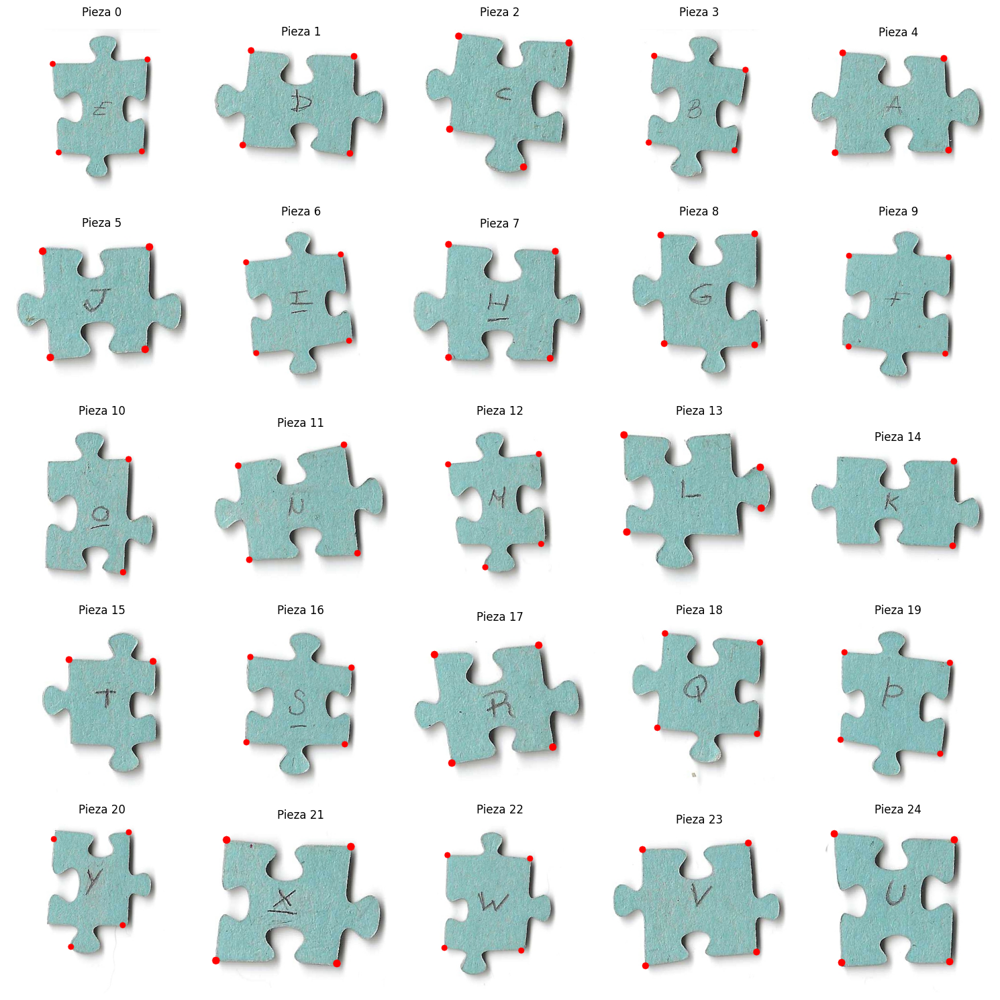

In [34]:
fig, axes = plt.subplots(5, 5, figsize=(15, 15))
axes = axes.flatten()

for idx in range(25):
    corners = detect_corners_hough(
        back_masks[idx], 
        back_contours[idx],
        min_line_length=40,
        max_line_gap=15,
        threshold=20,
        verbose=False
    )
    
    img = back_rois[idx].copy()
    if corners is not None:
        for corner in corners:
            cv.circle(img, (int(corner[0]), int(corner[1])), 8, (0, 0, 255), -1)
    
    axes[idx].imshow(cv.cvtColor(img, cv.COLOR_BGR2RGB))
    axes[idx].set_title(f'Pieza {idx}')
    axes[idx].axis('off')

plt.tight_layout()
plt.show()

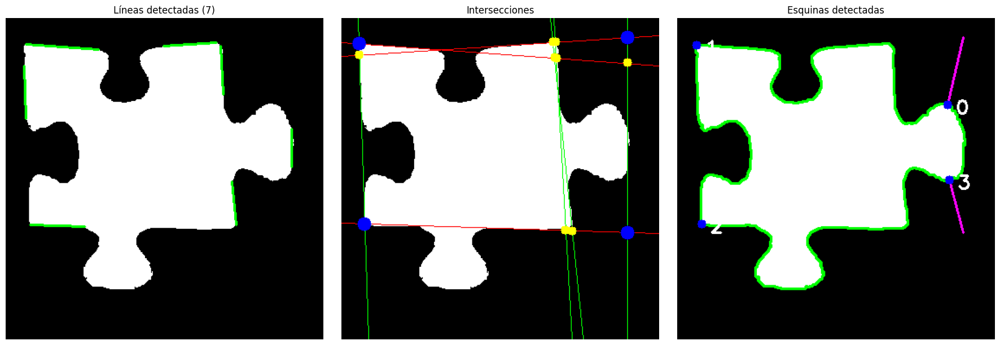

Esquinas detectadas: [[312 100]
 [ 22  31]
 [ 28 238]
 [314 187]]


In [35]:
i = 13
corners_hough = detect_corners_hough(
    back_masks[i], 
    back_contours[i], 
    min_line_length=40,
    max_line_gap=15,     
    threshold=20,
    verbose=True
)

print(f"Esquinas detectadas: {corners_hough}")

Vemos que quizás no es el método más seguro, ya que si encuentra una intersección muy alejada, puede tener problemas a la hora de buscar el punto del contorno más cercano. Ya que por ejemplo una pieza saliente puede estar más cerca y considerar ese como una esquina.


## Método de barrido angular desde el centroide.

<p style="text-align: center"><img src="fotos\ejemplos\ejemplo_barrido_angular.jpg"></p>

In [36]:
i = 10

En este método vamos a utilizar la función find_peaks de scipy sobre una función definida de la siguiente manera:

In [37]:
import scipy
from scipy.signal import find_peaks

La siguiente celda de código nos dice las diferentes distancias que tienen cada punto del contorno de la pieza respecto al centroide. De manera que un pico es una protuberancia y se trata de posibles candidatas a esquinas.

Text(0.5, 1.0, 'Función de distancia al centroide con picos')

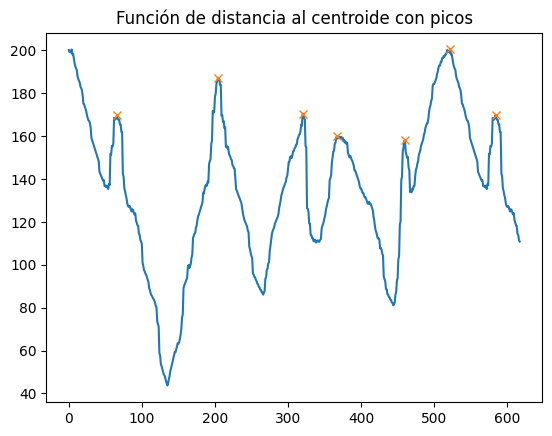

In [38]:
import scipy

centroide = np.mean(back_contours[i], axis=0).astype(int)
f_d_centroide = []

for punto in back_contours[i]:
    distancia = np.linalg.norm(punto - centroide)
    f_d_centroide.append(distancia)

f_d_centroide = f_d_centroide + f_d_centroide[:100]

peaks, _ = find_peaks(f_d_centroide, prominence=18)

plt.plot(f_d_centroide)
plt.plot(peaks, np.array(f_d_centroide)[peaks], "x")
plt.title('Función de distancia al centroide con picos')

Vamos a visualizarlo en la pieza de ejemplo para ver los picos o "esquinas" que encuentra la función.

In [39]:
reindexed_peaks = list(set([peak % len(back_contours[i]) for peak in peaks]))
peaks = reindexed_peaks

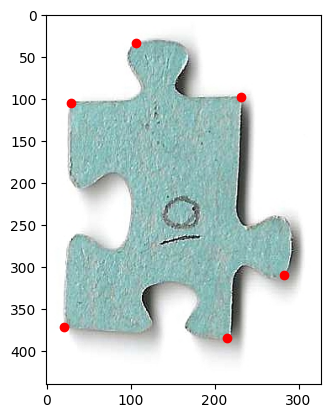

In [40]:
cords_picos = back_contours[i][peaks]
plt.imshow(cv.cvtColor(back_rois[i], cv.COLOR_BGR2RGB))
plt.scatter(cords_picos[:, 0, 0], cords_picos[:, 0  , 1], color='red')

Vemos que considera a veces aristas salientes como posibles esquinas. Como no queremos que acaben como soluciones finales, vamos a crear la función loss_square. Como las esquinas de las piezas forman rectángulos o cuadrados, lo que hace loss square es darle una puntuación a un conjunto de puntos que nos dice qué tan cuadrada es la suma de los cosenos de los ángulos que forman las aristas (vectores que unen dos esquinas). Lo que buscamos es el conjunto que lo minimiza ya que la función coseno devuelve 0 cuando son perpendiculares.

In [41]:
from itertools import combinations

i_posible_squares = list(combinations(cords_picos, 4))

def loss_square(esquinas: list[np.ndarray]) -> float:
    # Calcula una funciona de puntuacion para un cuadrado dado sus esquinas cuanto mas bajo mejor

    v_aristas = []
    for i in range(4):
        p1 = esquinas[i][0]
        p2 = esquinas[(i + 1) % 4][0]
        v_aristas.append(p2 - p1)

    loss = 0.0

    for i in range(4):
        v1 = v_aristas[i]
        v2 = v_aristas[(i + 1) % 4]

        # Sacar el coseno del ángulo

        cos_theta = np.dot(v1, v2) / (np.linalg.norm(v1) * np.linalg.norm(v2))
        loss += cos_theta ** 2 


    return loss

best_square = None

for esquinas in i_posible_squares:
    score = loss_square(esquinas)
    if best_square is None or score < best_square[0]:
        best_square = (score, esquinas)

print(f'Mejor cuadrado con loss: {best_square[0]}') 

Mejor cuadrado con loss: 0.1925752247951362


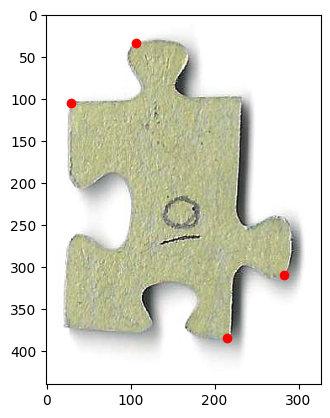

In [42]:
plt.imshow(back_rois[i], cmap='gray')
plt.scatter(*zip(*[esquina[0] for esquina in best_square[1]]), color='red')

Para este caso, aunque no son las esquinas correctas, encuentra una combinación de puntos que forma un rectángulo casi perfecto y da mejor puntuación que la real.
Para arreglarlo le metemos dos coeficientes a la función a minimizar:
- c1: cuantifica qué tanto tenemos que penalizar la varianza de las longitudes de los lados. En el ejemplo anterior vemos que hay dos lados muy largos y dos muy cortos. Si penalizamos más la varianza (diferencia entre distancias de lados) de los lados, va a bajar en el ranking de preferencia y la solución real que es más cuadrada va pasar a primer puesto.
- c2: Penaliza que la distancia del vértice al centroide sea demasiado diferente entre los vértices. Así conseguimos también que sea lo más cuadrada posible.

In [43]:
def ordenar_esquinas_circular(esquinas, centroide):
    """Ordena las esquinas en sentido antihorario respecto al centroide"""
    def angulo(punto):
        return np.arctan2(punto[0][1] - centroide[0][1], punto[0][0] - centroide[0][0])
    return sorted(esquinas, key=angulo)

def loss_square(esquinas: list[np.ndarray], centroide, c1 = 1, c2 = 1, verbose=False) -> float:
        # Primero ordenamos las esquinas en sentido circular
        esquinas = ordenar_esquinas_circular(list(esquinas), centroide)
        
        # Calcula una funcion de puntuacion para un cuadrado dado sus esquinas cuanto mas bajo mejor
        v_aristas = []
        for i in range(4):
            p1 = esquinas[i][0]
            p2 = esquinas[(i + 1) % 4][0]
            v_aristas.append(p2 - p1)

        # Penalizacion angulos (queremos 90 grados, cos(90) = 0)
        loss_angulos = 0.0
        for i in range(4):
            v1 = v_aristas[i]
            v2 = v_aristas[(i + 1) % 4]
            cos_theta = np.dot(v1, v2) / (np.linalg.norm(v1) * np.linalg.norm(v2))
            loss_angulos += cos_theta ** 2

        # Penalizacion varianza longitudes lados
        lengths = [np.linalg.norm(v) for v in v_aristas]
        varianza_lados = np.var(lengths)
        loss_varianza = c1 * varianza_lados

        # Penalizacion distancia vertice-centroide
        distancias = [np.linalg.norm(esquina - centroide) for esquina in esquinas]
        varianza_distancias = np.var(distancias)
        loss_centroide = c2 * varianza_distancias

        loss = loss_angulos + loss_varianza + loss_centroide

        if verbose:
            print(f'Loss total: {loss:.4f} | Angulos: {loss_angulos:.4f} | Varianza lados (c1={c1}): {loss_varianza:.4f} | Varianza centroide (c2={c2}): {loss_centroide:.4f}')
            print(f'Longitudes lados: {[f"{l:.1f}" for l in lengths]}')

        return loss

Por último creamos la función find_corners, que lo que hace es aplicar todo el procedimiento para cada pieza. Encuentra el centroide, saca los candidatos a esquina con find_peaks y encuentra el conjunto de puntos que minimiza loss_square.

In [44]:
def find_corners(contour: np.ndarray, c1, c2, verbose=False) -> list[np.ndarray]:
    # Sacamos el centroide
    centroide = np.mean(contour, axis=0).astype(int)
    f_d_centroide = []

    for punto in contour:
        distancia = np.linalg.norm(punto - centroide)
        f_d_centroide.append(distancia)

    f_d_centroide = f_d_centroide + f_d_centroide[:100]

    # Picos candidatos
    peaks, _ = find_peaks(f_d_centroide, prominence=18)
    reindexed_peaks = list(set([peak % len(contour) for peak in peaks]))
    peaks = reindexed_peaks

    i_posible_squares = list(combinations(peaks, 4))

    best_square = None

    for i_esquinas in i_posible_squares:
        esquinas = contour[list(i_esquinas)]
        score = loss_square(esquinas, centroide, c1, c2, verbose=verbose)
        if best_square is None or score < best_square[0]:
            best_square = (score, esquinas)

    # Mostrar desglose solo del mejor resultado
    if verbose:
        loss_square(best_square[1], centroide, c1, c2, verbose=verbose)

    return np.reshape(best_square[1], (-1, 2))

La mejor combinación que hemos encontrado es:

Text(0.5, 1.0, 'Esquinas detectadas con c1=0.0001 y c2=0')

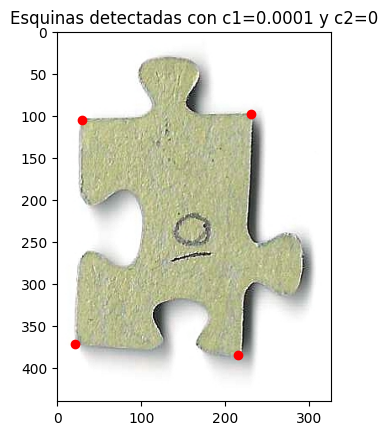

In [45]:
c1 = 0.0001
c2 = 0
i = 10

contorno = back_contours[i]
corners = find_corners(contorno, c1, c2, verbose=False)
plt.imshow(back_rois[i], cmap='gray')
plt.scatter(corners[:, 0], corners[:, 1], color='red')
plt.title(f'Esquinas detectadas con c1={c1} y c2={c2}')

Comprobamos para todas:

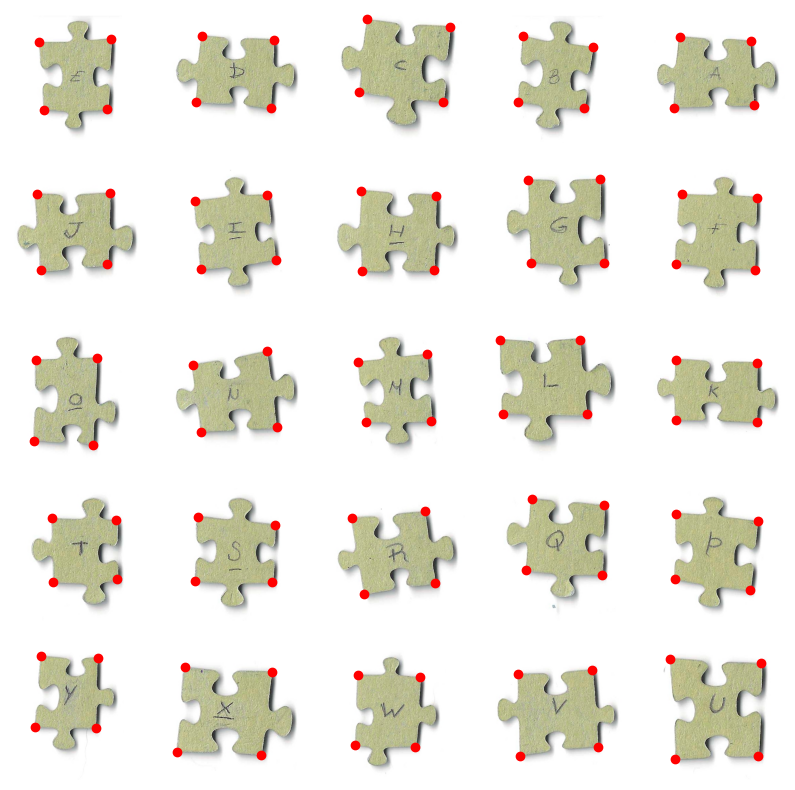

In [46]:

fig, ax = plt.subplots(5, 5, figsize=(10, 10))
ax = ax.flatten()

for i in range(5):
    for j in range(5):
        index = i * 5 + j
        contour = back_contours[index]
        esquinas = find_corners(contour, c1, c2)

        plt.sca(ax[index])
        plt.imshow(back_rois[index], cmap='gray')
        plt.scatter(esquinas[:, 0], esquinas[:, 1], color='red')
        plt.axis('off')



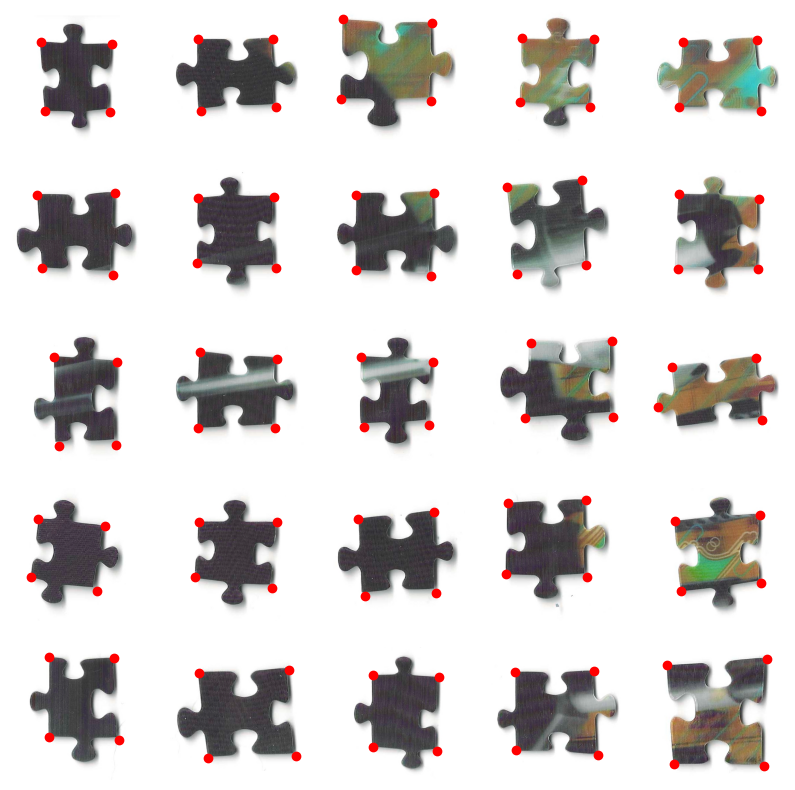

In [47]:
#esquinas de los fronts

fig, ax = plt.subplots(5, 5, figsize=(10, 10))
ax = ax.flatten()

for i in range(5):
    for j in range(5):
        index = i * 5 + j
        contour = front_contours[index]
        esquinas = find_corners(contour, c1, c2)

        plt.sca(ax[index])
        plt.imshow(front_rois[index], cmap='gray')
        plt.scatter(esquinas[:, 0], esquinas[:, 1], color='red')
        plt.axis('off')


En el front no encuentra para una pieza el mejor conjunto, pero da igual, porque para el algoritmo utilizaremos solo las piezas desde atrás. También tomamos esta decisión porque al ser más simple, el thresholding es mucho mejor y se puede generalizar a cualquier puzzle, ya que todos por la parte de detrás son también de un solo color y simples, no hay que liarse con valores por culpa de los colores.

In [48]:
df = pd.DataFrame(columns=['contorno', 'esquinas', 'f_contorno', 'f_esquinas'])

df['contorno'] = [np.array(list(map(lambda x: (x[0]), contorno))) for contorno in back_contours]
df['esquinas'] = [find_corners(c, c1, c2) for c in back_contours]
df['f_contorno'] = [np.array(list(map(lambda x: (x[0]), contorno))) for contorno in front_contours]
df['f_esquinas'] = [find_corners(c, c1, c2) for c in front_contours]

In [49]:
df

,contorno,esquinas,f_contorno,f_esquinas
0,"[[155, 38], [154, 39], [149, 39], [148, 40], [...","[[260, 347], [274, 100], [22, 113], [38, 350]]","[[130, 50], [129, 51], [124, 51], [123, 52], [...","[[22, 115], [40, 367], [273, 369], [280, 121]]"
1,"[[108, 24], [106, 26], [106, 36], [105, 37], [...","[[108, 24], [346, 271], [88, 251], [357, 39]]","[[340, 26], [339, 27], [314, 27], [313, 28], [...","[[350, 30], [360, 263], [94, 32], [104, 276]]"
2,"[[97, 27], [96, 28], [96, 30], [94, 32], [94, ...","[[97, 27], [320, 268], [74, 239], [340, 48]]","[[28, 26], [28, 28], [27, 29], [28, 30], [28, ...","[[28, 26], [279, 37], [277, 257], [23, 251]]"
3,"[[151, 39], [150, 40], [139, 40], [137, 42], [...","[[243, 331], [35, 89], [20, 309], [272, 125]]","[[140, 26], [139, 27], [133, 27], [132, 28], [...","[[269, 98], [27, 95], [254, 324], [21, 308]]"
4,"[[95, 25], [94, 26], [94, 34], [93, 35], [93, ...","[[95, 25], [77, 263], [344, 255], [334, 40]]","[[323, 25], [322, 26], [300, 26], [299, 27], [...","[[106, 37], [367, 270], [354, 31], [92, 257]]"
5,"[[288, 29], [287, 30], [276, 30], [275, 31], [...","[[79, 32], [91, 261], [290, 244], [299, 29]]","[[293, 29], [292, 30], [282, 30], [281, 31], [...","[[306, 276], [313, 32], [80, 37], [96, 255]]"
6,"[[156, 29], [155, 30], [153, 30], [151, 32], [...","[[24, 110], [306, 316], [43, 350], [276, 89]]","[[127, 29], [126, 30], [124, 30], [123, 31], [...","[[22, 330], [291, 97], [298, 348], [24, 100]]"
7,"[[101, 26], [101, 28], [100, 29], [100, 55], [...","[[101, 26], [102, 288], [339, 287], [348, 42]]","[[316, 29], [315, 30], [296, 30], [295, 31], [...","[[83, 37], [339, 33], [82, 286], [329, 306]]"
8,"[[273, 30], [271, 32], [270, 32], [269, 31], [...","[[307, 30], [320, 289], [87, 33], [95, 288]]","[[242, 30], [241, 31], [236, 31], [235, 32], [...","[[21, 53], [265, 297], [252, 33], [52, 323]]"
9,"[[184, 28], [183, 29], [181, 29], [179, 31], [...","[[43, 88], [308, 100], [22, 331], [300, 353]]","[[147, 26], [146, 27], [145, 27], [144, 28], [...","[[312, 102], [34, 87], [28, 348], [311, 350]]"


Guardamos las esquinas en un archivo comprimido .pkl que lo guarda todo. Si se vuelve a ejecutar puede que los resultados para los demás notebooks cambien.

In [50]:
# Guardamos el df en un csv
#df.to_pickle('esquinas_detectadas.pkl')

In [51]:
for i, mask in enumerate(back_masks):
    #guardar imagenes
    cv.imwrite(f'fotos/segmented_scan_25/back_contours/{i:02d}.png', mask)

In [52]:
for i, mask in enumerate(front_masks):
    cv.imwrite(f'fotos/segmented_scan_25/front_contours/{i:02d}.png', mask)

<p style="color:red"><strong>Para ver la implementación del algoritmo que soluciona el puzzle en código, ir a 2_Explicacion_algoritmo_puzzle.ipynb</strong></p>